## Setup

In [ ]:
!pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 397.5/397.5 kB 4.2 MB/s eta 0:00:00


In [ ]:
!pip install umap

  Preparing metadata (setup.py) ... done
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3543 sha256=1fd7d647020ddd7751d5cbacbfa2c9babb6c032da5fa58635fb341daf88c12f7
  Stored in directory: /root/.cache/pip/wheels/15/f1/28/53dcf7a309118ed35d810a5f9cb995217800f3f269ab5771cb
Successfully built umap


In [ ]:
import json
import emoji

In [ ]:
!pip install emoji

In [ ]:
import pickle
from gensim.models import Word2Vec

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Word2Vect w/ Emojis

## Mapping

In [ ]:
emoji_mapping = {
    ':)': '😀',
    ':-)': '😀',
    ':(': '😞',
    ':-(': '😞',
    ':-/': '🫤',
    '<3': '❤️',
    'XD': '😆',
    'xD': '😆',
    'xd': '😆',
    ':D': '😄',
    ':O': '😲',
    ';)': '😉',
    ':P': '😜',
    '>:(': '😠',
    ':-*': '😘',
    ':*': '😘',
    'B)': '😎',
    '>:D': '😈',
    'O:)': '😇',
    ':|': '😐',
    ':S': '😖',
    ':X': '😶',
    '<(")': '🐦',
    '>:O': '😱',
    '\\o/': '🙌',
    '(^_^)/': '🌟',
    '(o_o)/': '🌜',
    '<>_<>': '🎮',
    '(>_<)': '😣',
    '(^_-)': '😄',
    '(^_^)b': '👍',
    '(~_^)': '😂',
    ':-D': '😁',
    ':|)': '😐',
    '>:)': '😏',
}

## Map emoticons to emoji

In [ ]:
sentences = []
train_path = "/content/drive/MyDrive/COMET_data/paracomet/dialogue/samsum/dialog_train_split5_collated.json"

with open(train_path, 'r') as file:
        data = json.load(file)
        for key, value in data.items():
            for k, v in value.items():
                for inner_key, inner_value in v.items():
                    if inner_key == "sentence":
                        sentences.append(inner_value)

In [ ]:
def extract_emojis(text):
    return [char for char in text if char in emoji.EMOJI_DATA]

def substitute_emojis(text, emoji_mapping):
    for key, value in emoji_mapping.items():
        text = text.replace(key, value)
    return text

In [ ]:
# map emoticons to emoji
mapped_dialogues = []

for s in sentences:
  mapped_dialogues.append(substitute_emojis(s, emoji_mapping))

## Train W2V model

In [ ]:
def preparing_data(data_path):
    if data_path:
        with open(data_path, "r", encoding="utf-8") as f:
            lines = f.readlines()
            train_data = [line.strip().split() for line in lines]
        return train_data
    else:
        print("Error path")

def train_model(size, window, min_count, workers, vocab_size, negative, epochs, train_data):
    # train model
    print("training word2vec")
    model = Word2Vec(
        train_data,
        vector_size=size,
        window=window,
        min_count=min_count,
        workers=workers,
        max_vocab_size=vocab_size,
        negative=negative,
        epochs=epochs  # Add epochs parameter
    )
    print("saving model")
    model.save("word2vec_twitter_data.bin")
    model.wv.save_word2vec_format("word2vec.txt")

# Assign values manually
dataset_path = "/content/drive/MyDrive/datasets/twitter_data.txt"
word2vec_size = 300
word2vec_window = 5
word2vec_min_count = 10
word2vec_workers = 4
word2vec_vocab_size = None
word2vec_negative = 5
word2vec_epochs = 20

train_data = preparing_data(dataset_path)
train_model(
    size=word2vec_size,
    window=word2vec_window,
    min_count=word2vec_min_count,
    workers=word2vec_workers,
    vocab_size=word2vec_vocab_size,
    negative=word2vec_negative,
    train_data=train_data,
    epochs=word2vec_epochs
)

training word2vec


KeyboardInterrupt: 

In [ ]:
# Save pre-trained model on drive
import shutil
dest_folder = "/content/drive/MyDrive/"
source_folder = f"/content/word2vec_twitter_data.bin"
shutil.copy(source_folder, dest_folder)

## Fine-tune on samsum

In [ ]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk

nltk.download('punkt')

# Load your new dataset (a list of sentences)
new_sentences = mapped_dialogues

# Tokenize the sentences into lists of words
tokenized_sentences = [word_tokenize(sentence.lower()) for sentence in new_sentences]

# Update the vocabulary with the new dataset
model.build_vocab(tokenized_sentences, update=True)

# Fine-tune the model on the new dataset
model.train(tokenized_sentences, total_examples=model.corpus_count, epochs=model.epochs)

# Save the fine-tuned model
fine_tuned_model_path = '/content/drive/MyDrive/fine_tuned_word2vec_model.bin'
model.save(fine_tuned_model_path)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## If you have pre-trained model start here

In [ ]:
model_path = "/content/drive/MyDrive/fine_tuned_word2vec_model.bin"
model = Word2Vec.load(model_path)

In [ ]:
import re

def starts_with_letter(s):
    return bool(re.match(r'^[a-zA-Z]', s))

In [ ]:
import string

def extract_words(emoji, model, topn, k, threshold):
    if emoji in model.wv.key_to_index:
        similar_words = model.wv.most_similar(emoji, topn=topn)
    else:
        return ''

    # Filter out emojis, punctuation, and short words
    result = [item[0] for item in similar_words if (starts_with_letter(item[0]) and  len(item[0]) > 3 and item[1] > threshold) ]

    return ', '.join(result[:k])

In [ ]:
extract_words('🎆',model,40,3,0.2)

'fireworks, firework, bonfire'

In [ ]:
model.wv.most_similar('😅', topn=40)

[('🙃', 0.6066611409187317),
 ('😐', 0.5237456560134888),
 ('😬', 0.514013946056366),
 ('😕', 0.5061970353126526),
 ('😒', 0.5005626678466797),
 ('😳', 0.49657824635505676),
 ('😓', 0.4948580265045166),
 ('😶', 0.4886380732059479),
 ('🙄', 0.48342227935791016),
 ('😪', 0.47992584109306335),
 ('💀', 0.47638019919395447),
 ('😩', 0.46276038885116577),
 ('😖', 0.45180800557136536),
 ('😑', 0.44434496760368347),
 ('😴', 0.42437848448753357),
 ('😣', 0.41085299849510193),
 ('😫', 0.40421921014785767),
 ('😔', 0.39213457703590393),
 ('🙁', 0.3891492784023285),
 ('🙂', 0.37104687094688416),
 ('bc', 0.36740222573280334),
 ('😆', 0.35298964381217957),
 ('😌', 0.3468169569969177),
 ('😭', 0.33519771695137024),
 ('😵', 0.33108434081077576),
 ('😥', 0.3230653703212738),
 ('😧', 0.3181031048297882),
 ('😂', 0.31742382049560547),
 ('😏', 0.31591105461120605),
 ('😎', 0.3127653896808624),
 ('lmao', 0.3121996521949768),
 ('🌚', 0.31180691719055176),
 ('😷', 0.3117811679840088),
 ('😰', 0.3108026087284088),
 ('😹', 0.31020545959472656

## Json emoji

In [ ]:
def replace_with_extraction(sentence, emoji, model, topn, num_words, threshold):
    replacement = extract_words(emoji, model, topn, num_words, threshold)

    if replacement:
        modified_sentence = sentence.replace(emoji, f"<E>{replacement}<\E>")
        return modified_sentence
    else:
        return sentence

In [ ]:
import re

def reduce_consecutive_emojis(input_string):
    # Create a pattern for the emojis in the list
    emoji_pattern = '|'.join(re.escape(emoji) for emoji in emoji.EMOJI_DATA )

    # Use regular expression to find consecutive occurrences of the same emoji
    pattern = re.compile(f'({emoji_pattern})\\1+')

    # Replace consecutive emojis with a single instance of that emoji
    result_string = pattern.sub(r'\1', input_string)

    return result_string

In [ ]:
def substitute_emojis_with_inferred_words(dialogues):

    modified_dialogues = []

    for sentence in dialogues:
      sub_emojies = []
      sentence = reduce_consecutive_emojis(sentence)
      emoji_in_sentence = extract_emojis(sentence)
      modified_sentence = sentence
      for emoji in emoji_in_sentence:
          modified_sentence = replace_with_extraction(sentence, emoji, model, 40, 3, 0.2)
          sub_emojies.append(emoji)
      modified_dialogues.append(modified_sentence)

    return modified_dialogues

In [ ]:
preprocessed_sentences = substitute_emojis_with_inferred_words(mapped_dialogues)

NameError: name 'mapped_dialogues' is not defined

In [ ]:
preprocessed_sentences

In [ ]:
def remap_sentences_emoji_codified(sentence, split):
    counter = 0
    split_str = f'dialog_{split}_split5_collated.json'

    with open(f"/content/drive/MyDrive/NLP-project/COMET_data/paracomet/dialogue/samsum/{split_str}", 'r') as file:
        data = json.load(file)

    new_data = {}
    for key, value in data.items():
        new_d = {}
        for k, v in value.items():
            new_value = {}
            for inner_key, inner_value in v.items():
                if inner_key == "sentence":
                    new_value[inner_key] = sentence[counter]
                    counter += 1
                else:
                    new_value[inner_key] = inner_value
            new_d[k] = new_value
        new_data[key] = new_d

    new_json_file_path = f'preprocessed_v2_dialog_{split}_split5_collated.json'
    with open(new_json_file_path, 'w') as new_file:
        json.dump(new_data, new_file, indent=2)

In [ ]:
split = "train"

In [ ]:
remap_sentences_emoji_codified(preprocessed_sentences, split)

In [ ]:
# move file to drive!
import shutil
dest_folder = "/content/drive/MyDrive/NLP-project/COMET_data/paracomet/dialogue/samsum/emoji_w2v/"
source_folder = f"/content/preprocessed_v2_dialog_{split}_split5_collated.json"
shutil.copy(source_folder, dest_folder)

## PCA & Plotting in 2d space

In [ ]:
emoji_embeddings_dict = {}

# Populate the dictionary with emoji embeddings
for emoji in emoji.EMOJI_DATA:
    if emoji in model.wv:
        emoji_embeddings_dict[emoji] = model.wv[emoji]

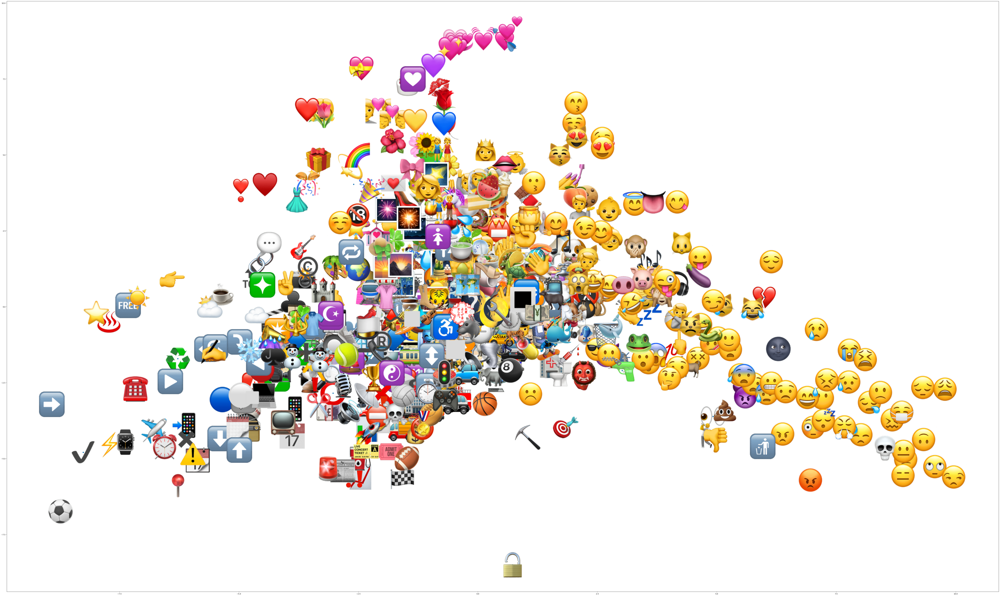

<Figure size 640x480 with 0 Axes>

In [22]:
import os
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

emoji_embeddings_dict = {}

for emoji_char in emoji.EMOJI_DATA:
    if emoji_char in model.wv:
        emoji_embeddings_dict[emoji_char] = model.wv[emoji_char]

# Read the CSV file to map emojis to their corresponding unicode image filenames
csv_file_path = '/content/drive/MyDrive/full_emoji.csv' 
df = pd.read_csv(csv_file_path)
emoji_to_image_file = {emoji: unicode_name + '.png' for emoji, unicode_name in df.set_index('emoji')['unicode'].to_dict().items()}

def offset_image(cords, emoji_char, ax):
    # Translate the emoji to its unicode image file name
    image_file_name = emoji_to_image_file.get(emoji_char)
    if image_file_name:
        # Construct the path to the image file
        img_path = os.path.join('/content/drive/MyDrive/emojis', image_file_name)
        if os.path.exists(img_path):
            # Read the image file
            img = plt.imread(img_path)
            
            im = OffsetImage(img, zoom=2)  # Adjust zoom as needed
            im.image.axes = ax
            ab = AnnotationBbox(im, (cords[0], cords[1]), frameon=False)
            ax.add_artist(ab)

# Extract emoji embeddings and labels
emoji_labels = list(emoji_embeddings_dict.keys())
emoji_embeddings = np.array(list(emoji_embeddings_dict.values()))

# Perform PCA to reduce dimensions to 2D
pca = PCA(n_components=2)
emoji_2d = pca.fit_transform(emoji_embeddings)

# Plot the 2D embeddings
fig, ax = plt.subplots(figsize=(100, 60))
ax.scatter(emoji_2d[:, 0], emoji_2d[:, 1])

# Annotate the points with emojis
for i, label in enumerate(emoji_labels):
    offset_image([emoji_2d[i, 0], emoji_2d[i, 1]], label, ax)

plt.show()
plt.savefig("/emoji.png")  # Save the figure to the local environment
